In [ ]:
#hide
#all_examples

## Table of Contents
* [Chapter 1](#chapter1)
    * [Section 1.1](#section_1_1)
        * [Sub Section 1.1.1](#sub_section_1_1_1)
* [Chapter 2](#chapter2)
    * [Section 2.1](#section_2_1)
        * [Sub Section 2.1.1](#sub_section_2_1_1)
        * [Sub Section 2.1.2](#sub_section_2_1_2)
    * [Section 2.2](#section_2_2)
        * [Sub Section 2.2.1](#sub_section_2_2_1)
        * [Sub Section 2.2.2](#sub_section_2_2_2)
* [Chapter 3](#chapter3)
    * [Section 3.1](#section_3_1)
        * [Sub Section 3.1.1](#sub_section_3_1_1)
        * [Sub Section 3.1.2](#sub_section_3_1_2)
    * [Section 3.2](#section_3_2)
        * [Sub Section 3.2.1](#sub_section_3_2_1)
        * [Sub Section 3.2.2](#sub_section_3_2_2)
* [Chapter 4](#chapter4)
* [Chapter 5](#chapter5)
    * [5.1 Predictions](#section_5_1)
* [Chapter 6](#chapter6)
* [Chapter 7](#chapter7)

## 1. Using fastai for semantic segmentation
<a class="anchor" id="chapter1"></a>

Here we use U-net for deadwood semantic segmentation. This notebook is based on the notebook "Using fastai for segmentation" by Janne Mäyrä.

## 1.1 Importing the libraries <a class="anchor" id="section_1_1"></a>

In [2]:
from pathlib import Path
import os
os.environ['PROJ_LIB']='/opt/conda/share/proj' # This should fix "ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed". Does not seem to work as of 17.5.2022. The error message disappears when running this cell a second time though. Using a workaround where using the command "export PROJ_LIB=/opt/conda/share/proj" in the Singularity terminal fixes the issue.
from drone_detector.processing.tiling import * #Commented this one out 18.3.2022 because Janne updated the tiling on 10.3.2022. Look into how to set up the new tiling.

from fastai.vision.all import *
from fastai.callback.wandb import * # Added 24.11.2022
from fastai.callback.progress import ShowGraphCallback # Added 24.11.2022
from drone_detector.engines.fastai.data import *
from drone_detector.metrics import * # JaccardCoeffMulti is imported from here
import geopandas as gpd
import rasterio as rio
from rasterio import plot as rioplot
from osgeo import gdal, ogr
import wandb

#wandb.login()

## 2. Tiling the data <a class="anchor" id="chapter2"></a>

### 2.1 Setting the folders paths <a class="anchor" id="section_2_1"></a>

Setting the folder paths for the training data:

In [4]:
tile_folder = Path('/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/train/images')
vector_folder = Path('/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/train/vectors')

outpath = Path('/scratch/deadwood/segmentation/processed/train')

if not os.path.exists(outpath): os.makedirs(outpath)

tiles = sorted(os.listdir(tile_folder))
vectors = sorted([f for f in os.listdir(vector_folder) if f.endswith('geojson')])
assert len(tiles) == len(vectors)

Setting the folder paths for the test data:

In [3]:
testdata_tile_folder = Path('/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images')
testdata_vector_folder = Path('/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/vectors')

testdata_outpath = Path('/scratch/deadwood/segmentation/processed/test')

if not os.path.exists(testdata_outpath): os.makedirs(testdata_outpath)

test_tiles = sorted(os.listdir(testdata_tile_folder))
test_vectors = sorted([f for f in os.listdir(testdata_vector_folder) if f.endswith('geojson')])
assert len(test_tiles) == len(test_vectors)

### 2.2 Adding a 'groundwood' column to the vector data <a class="anchor" id="section_2_2"></a>

The vectors (.geojson files) do not have a column called 'groundwood', only a column called 'label' of type string ('groundwood' and 'uprightwood'). Here we convert the contents of the 'label' column to a column called 'groundwood' with integer values of 1 (uprightwood) and 2 (groundwood):

Training data:

In [4]:
#  17.5.2022: This is still relevant if using files where the cell content is not corret, aka 1 or 2?
### For the older tiler before the update 10.3.2022
for fname in os.listdir(vector_folder):
    gdf = gpd.read_file(vector_folder/fname)
    gdf['groundwood'] = gdf.apply(lambda row: 2 if row.label == 'groundwood' else 1, axis=1)
    gdf.to_file(vector_folder/fname)

Test data:

In [5]:
for fname in os.listdir(testdata_vector_folder):
    gdf = gpd.read_file(testdata_vector_folder/fname)
    gdf['groundwood'] = gdf.apply(lambda row: 2 if row.label == 'groundwood' else 1, axis=1)
    gdf.to_file(testdata_vector_folder/fname)

### 2.3 Tiling the image and vector files <a class="anchor" id="section_2_3"></a>

For semantic segmentation, we split the data (.tiff images and .geojson vectors) into a 256 times 256 pixel grid. Vector files are tiled and rasterized to the same grid, in such way that raster images are saved. The rasterized vector tiles are saved to the `rasterized_vector_tiles/`folder.

This method saves the target mask for each cell even if they don't contain any masks.

Tiling the training data:

In [47]:
for t in tiles:
    if not os.path.exists(outpath/t[:-4]): os.makedirs(outpath/t[:-4])
    shp_fname = t.replace('tif', 'geojson')
    tilesize = 256
    tiler = Tiler(outpath=outpath/t[:-4], gridsize_x=tilesize, gridsize_y=tilesize, overlap=(0,0))
    tiler.tile_raster(str(tile_folder/t))
    tiler.tile_and_rasterize_vector(tile_folder/t, vector_folder/shp_fname, column='groundwood', keep_bg_only=False)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

Tiling the test data:

In [7]:
for t in test_tiles:
    if not os.path.exists(outpath/t[:-4]): os.makedirs(outpath/t[:-4]) # 19.12.2022: This line gave errors when running the 10 plot proto dataset. Test with full dataset.
    shp_fname = t.replace('tif', 'geojson')
    tilesize = 256
    tiler = Tiler(outpath=testdata_outpath/t[:-4], gridsize_x=tilesize, gridsize_y=tilesize, overlap=(0,0))
    tiler.tile_raster(str(testdata_tile_folder/t))    
    tiler.tile_and_rasterize_vector(testdata_tile_folder/t, testdata_vector_folder/shp_fname, column='groundwood', keep_bg_only=False)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

0it [00:00, ?it/s]

0it [00:00, ?it/s]

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[
/opt/conda/lib/python3.9/site-packages/geopandas/tools/clip.py:66: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-uniqu

### 2.4 Checking the tiling <a class="anchor" id="section_2_4"></a>

To check that the tiling was succesfull, we take and compare a random sample of one tiled image and one tiled vector.

#### 2.4.1 Checking the tiling for training data <a class="anchor" id="section_2_4_1"></a>

In [8]:
outpath

Path('/scratch/deadwood/segmentation/processed/train')

In [27]:
os.listdir(outpath)

['1_1047',
 '41_1219',
 '51_1258',
 '54_1261',
 '79_1115',
 '33_1199',
 '69_1281',
 '9_1123',
 '59_1266',
 '48_1255',
 '57_1264',
 '71_1285',
 '56_1263',
 '23_1166',
 '62_1269',
 '61_1268',
 '26_1173',
 '47_1250',
 '64_1273',
 '36_1208',
 '7_1111',
 '17_1144',
 '5_1103',
 '40_1216',
 '25_1172',
 '76_1295',
 '18_1145',
 '53_1260',
 '4_1092',
 '65_1274',
 '39_1215',
 '6_1110',
 '45_1247',
 '60_1267',
 '46_1249',
 '49_1256',
 '37_1209',
 '35_1206',
 '42_1230',
 '29_1186',
 '32_1189',
 '10_1128',
 '34_1200',
 '30_1187',
 '77_1300',
 '11_1129',
 '19_1150',
 '20_1151',
 '44_1234',
 '68_1279',
 '50_1257',
 '21_1157',
 '38_1210',
 '63_1270',
 '78_1304',
 '70_1282',
 '43_1233',
 '75_1293',
 '73_1287',
 '31_1188',
 '28_1183',
 '3_1091',
 '2_1086',
 '58_1265',
 '67_1276',
 '22_1162',
 '55_1262',
 '52_1259',
 '16_1140',
 '72_1286',
 '14_1137']

In [4]:
for d in [d for d in os.listdir(outpath) if d != 'models']:
    print(f"""{d} was split into {len(os.listdir(outpath/d/'raster_tiles'))} raster cells and {len(os.listdir(outpath/d/"rasterized_vector_tiles"))} vector cells""")

1_1047 was split into 64 raster cells and 64 vector cells
41_1219 was split into 64 raster cells and 64 vector cells
51_1258 was split into 64 raster cells and 64 vector cells
54_1261 was split into 64 raster cells and 64 vector cells
79_1115 was split into 64 raster cells and 64 vector cells
33_1199 was split into 64 raster cells and 64 vector cells
69_1281 was split into 64 raster cells and 64 vector cells
9_1123 was split into 64 raster cells and 64 vector cells
59_1266 was split into 64 raster cells and 64 vector cells
48_1255 was split into 64 raster cells and 64 vector cells
57_1264 was split into 64 raster cells and 64 vector cells
71_1285 was split into 64 raster cells and 64 vector cells
56_1263 was split into 64 raster cells and 64 vector cells
23_1166 was split into 64 raster cells and 64 vector cells
61_1268 was split into 64 raster cells and 64 vector cells
26_1173 was split into 64 raster cells and 64 vector cells
47_1250 was split into 64 raster cells and 64 vector cells

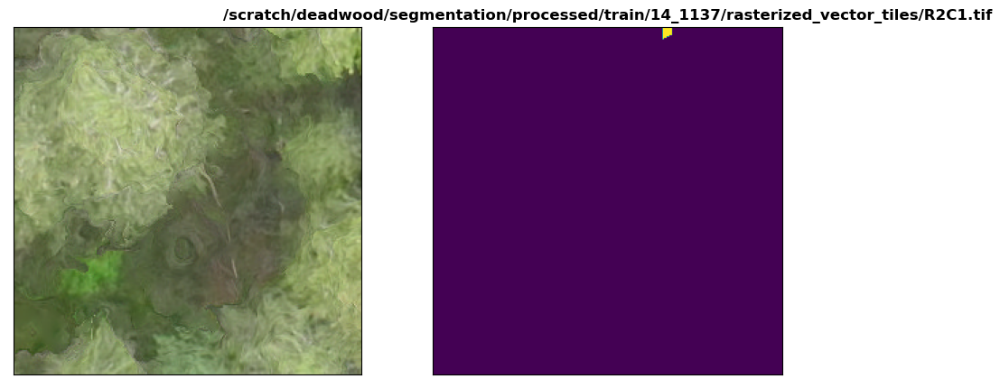

In [7]:
ex_file = random.sample(os.listdir(outpath/d/'rasterized_vector_tiles'), 1)[0]
fig, axs = plt.subplots(1,2, figsize=(11,5))
for a in axs:
    a.set_xticks([])
    a.set_yticks([])
with rio.open(outpath/d/"raster_tiles"/ex_file) as im:
    rioplot.show(im, ax=axs[0])
with rio.open(outpath/d/"rasterized_vector_tiles"/ex_file) as mask:
    rioplot.show(mask, ax=axs[1], title=outpath/d/"rasterized_vector_tiles"/ex_file)
    #rioplot.show((mask, 1), ax=axs[1]) # Changed to (mask, 1) due to an error in image handling. (mask, 1) shows the 1st band which has all the classes, groundwood, upright wood and background. Changed from: rioplot.show(mask, ax=axs[1])

#### 2.4.2 Checking the tiling for test data <a class="anchor" id="section_2_4_2"></a>

Check the tiling for test data:

In [12]:
testdata_outpath

Path('/scratch/deadwood/segmentation/processed/test')

In [8]:
for d in [d for d in os.listdir(testdata_outpath) if d != 'models']:
    print(f"""{d} was split into {len(os.listdir(testdata_outpath/d/'raster_tiles'))} raster cells and {len(os.listdir(testdata_outpath/d/"rasterized_vector_tiles"))} vector cells""")

62_1269 was split into 64 raster cells and 64 vector cells
7_1111 was split into 64 raster cells and 64 vector cells
76_1295 was split into 64 raster cells and 64 vector cells
4_1092 was split into 64 raster cells and 64 vector cells
65_1274 was split into 64 raster cells and 64 vector cells
49_1256 was split into 64 raster cells and 64 vector cells
10_1128 was split into 64 raster cells and 64 vector cells
77_1300 was split into 64 raster cells and 64 vector cells
19_1150 was split into 64 raster cells and 64 vector cells
78_1304 was split into 64 raster cells and 64 vector cells
43_1233 was split into 64 raster cells and 64 vector cells
73_1287 was split into 64 raster cells and 64 vector cells
28_1183 was split into 64 raster cells and 64 vector cells
58_1265 was split into 64 raster cells and 64 vector cells


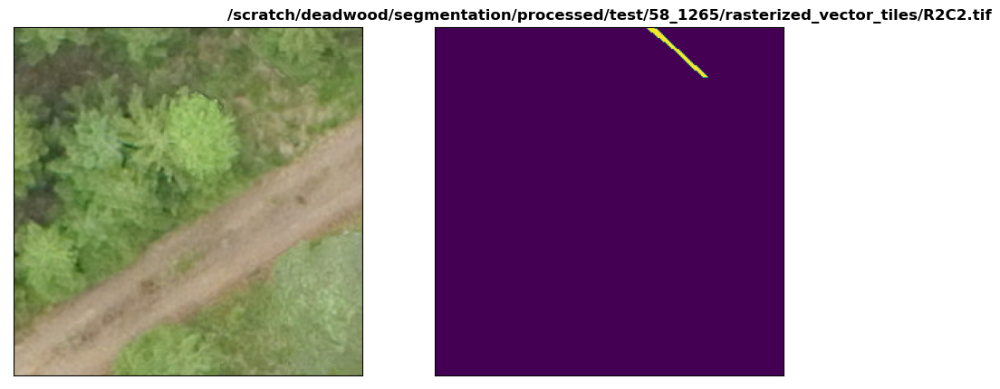

In [19]:
ex_file = random.sample(os.listdir(testdata_outpath/d/'rasterized_vector_tiles'), 1)[0]
fig, axs = plt.subplots(1,2, figsize=(11,5))
for a in axs:
    a.set_xticks([])
    a.set_yticks([])
with rio.open(testdata_outpath/d/"raster_tiles"/ex_file) as im:
    rioplot.show(im, ax=axs[0])
with rio.open(testdata_outpath/d/"rasterized_vector_tiles"/ex_file) as mask:
    rioplot.show(mask, ax=axs[1], title=(testdata_outpath/d/"rasterized_vector_tiles"/ex_file))
    #rioplot.show((mask, 1), ax=axs[1]) # Changed to (mask, 1) due to an error in image handling. (mask, 1) shows the 1st band which has all the classes, groundwood, upright wood and background. Changed from: rioplot.show(mask, ax=axs[1])

## 3 Setting up the data loaders for segmentation <a class="anchor" id="chapter3"></a>

The data loaders are used to tell fastai where the data is located, how it's labeled, the validation-train split, and what transformations (augmentations) to make on the data.

We use 20 % of the data for validation. By setting `seed=96` we always use the same virtual plots for model validation.

In [7]:
outpath = Path('/scratch/deadwood/segmentation/processed/train')

if not os.path.exists(outpath): os.makedirs(outpath)

fnames = [Path(f'{outpath}/{tile}/raster_tiles/{f}') 
         for tile in [til for til in os.listdir(outpath) if os.path.isdir(outpath/til) and til not in ['segmentation', 'models', 'test_plots']] # Added 'test_plots' on 12.12.2022 to see if it solves a FileNotFoundError
         for f in os.listdir(outpath/tile/'rasterized_vector_tiles')]

dls = SegmentationDataLoaders.from_label_func('/scratch/deadwood/segmentation/processed/train',
                                              valid_pct=0.2, seed=96, bs=16, # 11.5.2022: Added "valid_pct=0.2" and "seed=96" so that the validation set always contains the same virtual plots.
                                              codes=['Standing', 'Fallen'],
                                              fnames = fnames,
                                              label_func=partial(label_from_different_folder,
                                                                 original_folder='raster_tiles',
                                                                 new_folder='rasterized_vector_tiles'),
                                              item_tfms=[Resize(256)],
                                                   batch_tfms= [
                                                       *aug_transforms(size=224,
                                                                       do_flip=True,
                                                                       max_rotate=10,
                                                                       max_lighting=0.2,
                                                                       p_lighting=0.5,
                                                                       pad_mode='zeros'), # Added transform on 25.11.2022
                                                       Normalize.from_stats(*imagenet_stats)
                                              ],
                                              num_workers=0)

`label_from_different_folder` is a helper located in `drone_detector.engines.fastai.data`. That module also contains helpers to use with for instance multispectral images or time series of images.

Running `dls.show_batch` shows the original image in the left-hand column and the manually delineated an annotated target on the right-hand one.

In [ ]:
#doc(dls.show_batch)

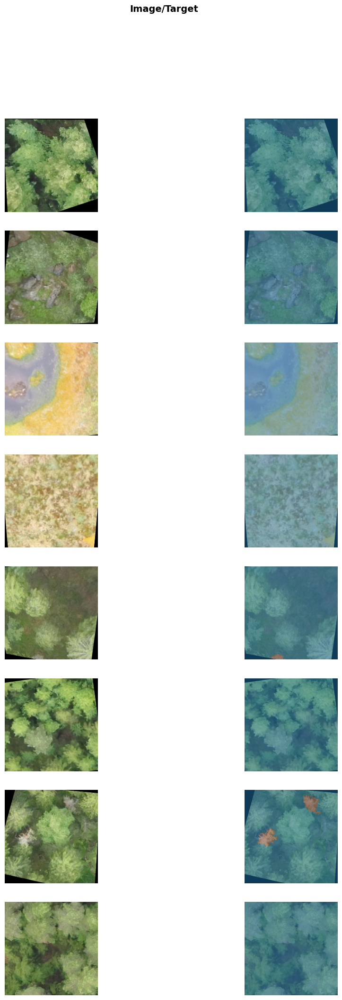

In [21]:
dls.show_batch(max_n=16)

## 4 Training the model <a class="anchor" id="chapter4"></a>

**From Janne's notebook:**
*Train basic U-Net, using pretrained Resnet50 as the encoder. `to_fp16()` tells our model to use half precision training, thus using less memory. Loss function is `FocalLossFlat`, and for segmentation we need to specify `axis=1`. Metrics are `Dice` and `JaccardCoeff`, fairly standard segmentation metrics.*

`n_out` should be 3, (`n_out=3`) because we have 3 classes (groundwood, standing and the background).

Train the model using different loss functions:

1. [ ] Focal Loss Flat
2. [ ] Label Smoothing Cross Entropy Flat
3. [ ] Cross Entropy

In [8]:
learn = unet_learner(dls, resnet50, pretrained=True, n_in=3, n_out=3,
                     metrics=[DiceMulti(), JaccardCoeffMulti()], 
                     loss_func=FocalLossFlat(axis=1)
                     ).to_fp16()

Search for a suitable learning rate.

SuggestedLRs(valley=0.00010964782268274575)

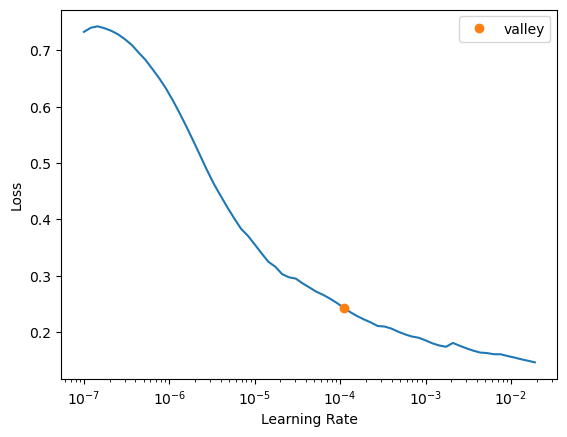

In [23]:
learn.lr_find()

The training is tracked using wandb.

In [24]:
wandb.init(name = 'FocalLossFlat',
           project = 'FullDataset')

wandb: Currently logged in as: tvtv. Use `wandb login --relogin` to force relogin


Train the model for 2 epochs with encoder layers frozen and 10 epochs with all layers unfrozen.

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.022872,0.014695,0.545328,0.234623,03:42
1,0.012046,0.009831,0.731805,0.438895,02:14


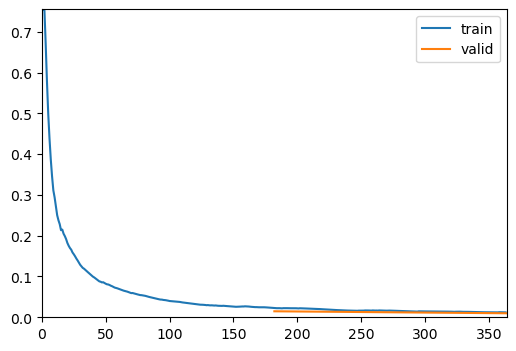

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.008206,0.008577,0.734131,0.445019,02:17
1,0.008526,0.009405,0.753223,0.468476,02:16
2,0.009190,0.008855,0.773580,0.503849,02:16
3,0.009019,0.007870,0.732709,0.449423,02:16
4,0.006715,0.007799,0.766398,0.493450,02:16
5,0.007139,0.007721,0.770325,0.492897,02:16
6,0.006659,0.007058,0.781463,0.514358,02:16
7,0.006064,0.006837,0.781831,0.517593,02:16
8,0.005297,0.006635,0.792524,0.536356,02:16
9,0.005967,0.006663,0.792522,0.536472,02:16


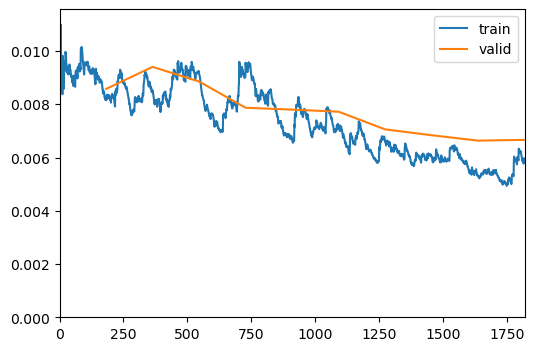

In [25]:
learn.fine_tune(10, freeze_epochs=2, base_lr=1e-4, cbs=[ShowGraphCallback, WandbCallback(log_preds_every_epoch=True)])

Return to full precision.

In [26]:
learn.to_fp32()

In [ ]:
#wandb.finish()

Check results.

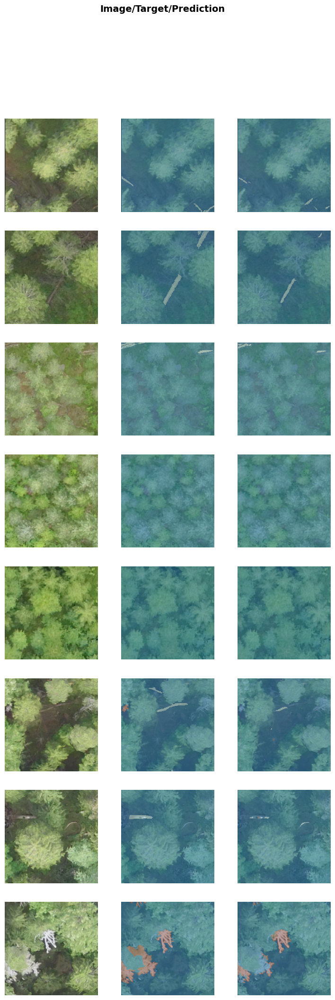

In [29]:
learn.show_results(max_n=8)

Check the loss, dice and IoU (Jaccard coefficient) for the validation set.

In [40]:
doc(learn.validate)

In [48]:
learn.validate(ds_idx=0)

(#3) [0.0054336050525307655,0.8067114368350156,0.5633429314002892]

Export the model for later use.

In [31]:
learn.path = Path('/scratch/deadwood/segmentation/models/fulldata')
#learn.export('unet-segmentation-test-proto10new-00.pkl')
learn.export('FocalLossFlat.pkl') # Loss function = Binary Cross Entropy

## 5 Test with holdout <a class="anchor" id="chapter5"></a>

Here the models are evaluated by showing them data that they haven't seen, i.e. a test set.  

Use the model we trained earlier. We run the model on images from the test set, which are images that the model has not seen before. Calculate the metrics on the tile-level and the plot-level. This part is from https://mayrajeo.github.io/historical-maps/train_model.html#example-result-patches

Import the predicton module:

In [9]:
from drone_detector.engines.fastai.predict import predict_segmentation_fastai

In [10]:
testlearn = load_learner('/scratch/deadwood/segmentation/models/fulldata/FocalLossFlat.pkl', cpu=False)

### 5.1 Tile-level predictions and preformance metrics <a class="anchor" id="section_5_1"></a>

Run the model on the test data and calculate tile-level metrics.

In [11]:
# 10.1.2023:
# Setting the testdata_outpath to /scratch/deadwood/segmentation/data/processed-test
# to test the tile-level metrics without the 3 problematic plots

testdata_outpath = Path('/scratch/deadwood/segmentation/data/processed-test/')

test_raster_path = Path('/scratch/deadwood/segmentation/data/processed-test/')
test_rasters = [Path(f'{testdata_outpath}/{tile}/raster_tiles/{f}') 
                 for tile in [til for til in os.listdir(testdata_outpath) if os.path.isdir(testdata_outpath/til) and til not in ['segmentation', 'models','truths']]
                 for f in os.listdir(testdata_outpath/tile/'rasterized_vector_tiles')]


In [17]:
test_rasters

[Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R7C0.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R6C4.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R3C4.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R6C0.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R6C5.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R6C3.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R2C4.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R5C5.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R6C7.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R0C4.tif'),
 Path('/scratch/deadwood/segmentation/data/processed-test/76_1295/raster_tiles/R1C4.tif'),

In [12]:
testdata_outpath

Path('/scratch/deadwood/segmentation/data/processed-test')

In [13]:
testdl = learn.dls.test_dl(test_rasters, with_labels=True, bs=32, shuffle=True)

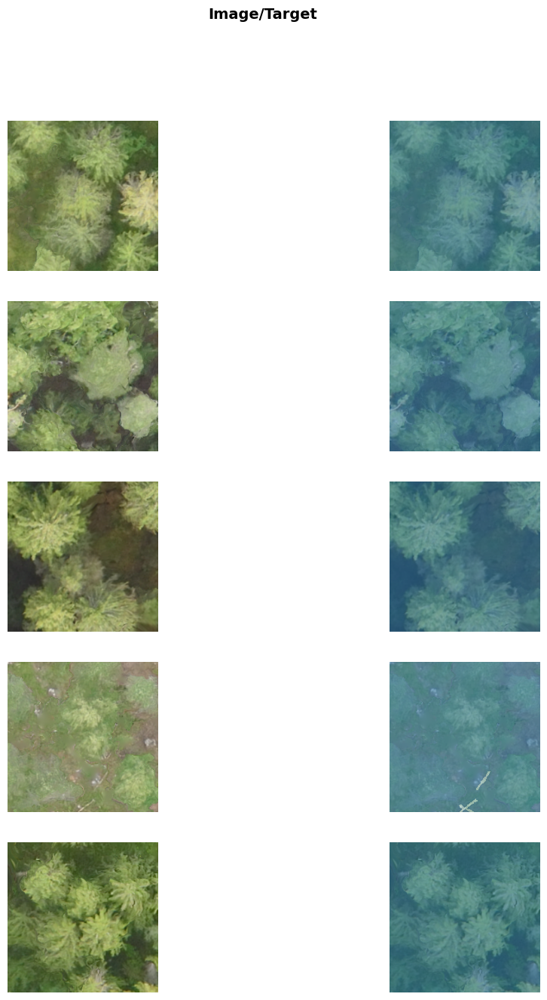

In [14]:
testdl.show_batch(max_n=10)

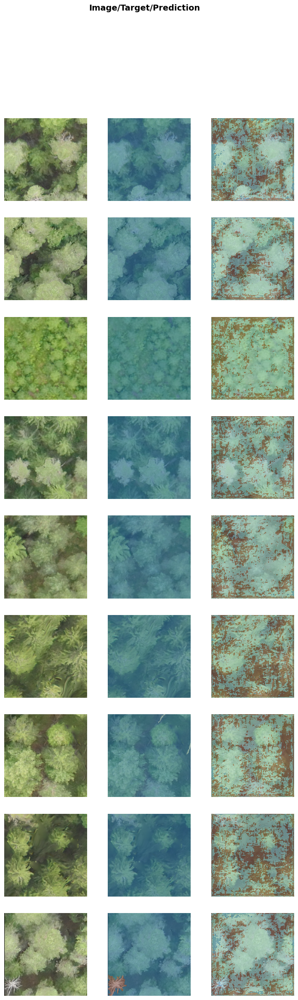

In [15]:
learn.show_results(dl=testdl)

Calculate the loss, dice, and IoU for the test tiles:

In [16]:
learn.validate(ds_idx=1) # Prints the loss, dicemulti and jaccard multi

(#3) [0.7173156142234802,0.019058664470273413,0.006863643012130199]

In [ ]:
wandb.finish() #23.12.2022

### 5.2 Plot-level predictions and preformance metrics <a class="anchor" id="section_5_2"></a>

Run the model on the test data and calculate plot-level metrics.

**XX.XX.2023:**  
Testing predictions using different tile overlap:  
1. [ ] Overlap 0
2. [ ] Overlap 64
2. [ ] Overlap 128

**XX.XX.2023:**  
Testing predictions using models with different loss functions:
1. [ ] Focal Loss Flat
2. [ ] Label Smoothing Cross Entropy Flat
3. [ ] Cross Entropy

Define which images to use for testing the model:

In [6]:
# As of 9.1.2023
test_rasters = [f'/scratch/deadwood/segmentation/data/test-images/{f}'
                
                for f in os.listdir('/scratch/deadwood/segmentation/data/test-images/') if f.endswith('tif')]

In [7]:
test_rasters

['/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/28_1183.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/62_1269.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/77_1300.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/76_1295.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/73_1287.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/7_1111.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/19_1150.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/10_1128.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/4_1092.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/65_1274.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/58_1265.tif',
 '/scratch/deadwood/data/raw/sudenpesankangas/virtual_pl

In [9]:
outfile_name

'/scratch/deadwood/segmentation/results/FocalLossFlat/28_1183.tif'

Run the prediction:

In [26]:
## ! ! CHANGE THE outfile_name FOLDER DEPENDING ON WHICH MODEL IS USED (19.12.2022)
for t in test_rasters:
    outfile_name = f'/scratch/deadwood/segmentation/results/{t.split("/")[-1]}' # 2.1.2023: Added /FocalLossFlat to the end of the file path
    
    #if not os.path.exists(outfile_name): os.makedirs(outfile_name)
        
    predict_segmentation_fastai('/scratch/deadwood/segmentation/models/fulldata/FocalLossFlat.pkl', t, outfile_name, # 17.5.2022: Changed from "predict_segmentation" to "predict_segmentation_fastai"
                         processing_dir='test-temp74', use_tta=False, # 2.1.2023: processing_dir='test-temp68'
                         tile_size=256,
                         tile_overlap=128) # tile_size=230 and tile_overlap=115 in the original code

Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/28_1183.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/62_1269.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/77_1300.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/76_1295.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/73_1287.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/7_1111.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/19_1150.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/10_1128.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/4_1092.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/65_1274.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/58_1265.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/78_1304.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/49_1256.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/data/raw/sudenpesankangas/virtual_plots/test/images/43_1233.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files


In [8]:
outfile_name

NameError: name 'outfile_name' is not defined

In [ ]:
#doc(predict_segmentation_fastai)

#### 5.2.1. Visualize plot-level results <a class="anchor" id="section_5_2_1"></a>
Visualize the plot level results:

In [4]:
from osgeo import gdal, ogr

In [5]:
raster_path = '/scratch/deadwood/segmentation/data/test-images/' # The virtual plots
vector_path = '/scratch/deadwood/segmentation/data/test-vectors/' # Digitized deadwood
rasterized_vector_path = '/scratch/deadwood/segmentation/processed/test/truths' # 19.12.2022 previous folder: /scratch/deadwood/segmentation/models/proto10new/test/truths

if not os.path.exists(rasterized_vector_path): os.makedirs(rasterized_vector_path)

raster_files = sorted([f for f in os.listdir(raster_path)])
vector_files = sorted([f for f in os.listdir(vector_path)])

In [6]:
from tqdm import tqdm
column = 'groundwood'
for r, v in tqdm(zip(raster_files, vector_files)):
    source_raster = gdal.Open(f'{raster_path}/{r}', gdal.GA_ReadOnly)
    source_vector = ogr.Open(f'{vector_path}/{v}')
    source_vector_layer = source_vector.GetLayer()

    output_raster = gdal.GetDriverByName('gtiff').Create(f'{rasterized_vector_path}/{r}',
                                                         source_raster.RasterXSize,
                                                         source_raster.RasterYSize,
                                                         1,
                                                         gdal.GDT_Int16)
    output_raster.SetProjection(source_raster.GetProjectionRef())
    output_raster.SetGeoTransform(source_raster.GetGeoTransform())
    band = output_raster.GetRasterBand(1)
    #band.SetNoDataValue(0)
    gdal.RasterizeLayer(output_raster, [1], source_vector_layer, options=[f'ATTRIBUTE={column}'])

    band = None
    source_vector = None
    source_raster = None
    output_raster = None   

11it [00:00, 19.69it/s]


In [6]:
result_path

NameError: name 'result_path' is not defined

In [6]:
import rasterio as rio
import rasterio.mask as rio_mask
from shapely.geometry import box

result_path = '/scratch/deadwood/segmentation/results' 

for f, pred, truth in zip(sorted(os.listdir(vector_path)), sorted(os.listdir(result_path)), sorted(os.listdir(rasterized_vector_path))):
    temp_gdf = gpd.read_file(f'{vector_path}/{f}')
    
    shapes = [box(*temp_gdf.total_bounds)]
    
    with rio.open(f'{result_path}/{pred}') as src:
        out_im, out_tfm = rio_mask.mask(src, shapes, crop=True) #, all_touched=True) #9.1.2023: Added pad=True and all_touched=True
        out_meta = src.meta

    out_meta.update({"driver": "GTiff",
                     "height": out_im.shape[1],
                     "width": out_im.shape[2],
                     "transform": out_tfm})
    
    
    with rio.open(f'{result_path}/{pred}', "w", **out_meta) as dest:
        dest.write(out_im)
        
    with rio.open(f'{rasterized_vector_path}/{truth}') as src:
        out_im, out_tfm = rio_mask.mask(src, shapes, crop=True) #, all_touched=True) #9.1.2023: Added pad=True and all_touched=True
        out_meta = src.meta

    out_meta.update({"driver": "GTiff",
                     "height": out_im.shape[1],
                     "width": out_im.shape[2],
                     "transform": out_tfm})
    
    
    with rio.open(f'{rasterized_vector_path}/{truth}', "w", **out_meta) as dest:
        dest.write(out_im)

In [7]:
import matplotlib.pyplot as plt
import rasterio.plot as rioplot

<AxesSubplot: >

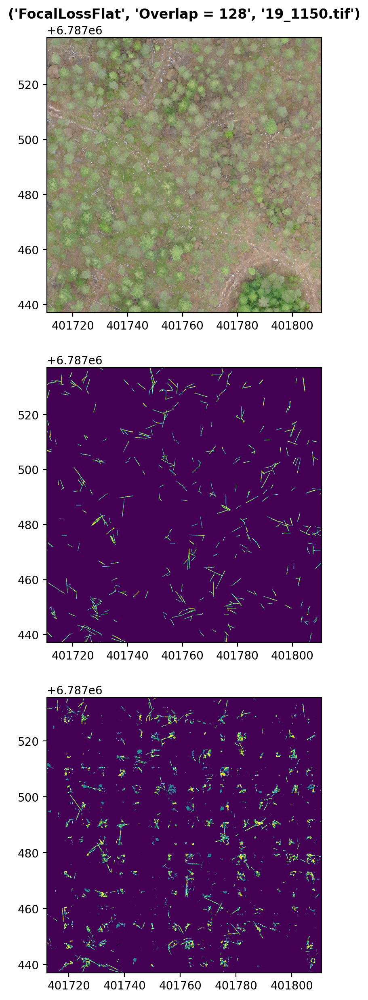

In [8]:
fig, axs = plt.subplots(3,1, figsize=(7,15), dpi=200)

ix = 1
#ix = random.randint(0,1)
truths = sorted(os.listdir(rasterized_vector_path))
preds = sorted(os.listdir(result_path))

im = rio.open(f'{raster_path}/{truths[ix]}')
rioplot.show(im, ax=axs[0], title = ('FocalLossFlat', 'Overlap = 128', (truths[ix]))) #'Segmentation Tile Overlap 128')

truth = rio.open(f'{rasterized_vector_path}/{truths[ix]}')
rioplot.show(truth, ax=axs[1], vmin=0, vmax=2)

pred = rio.open(f'{result_path}/{truths[ix]}')
rioplot.show(pred, ax=axs[2], vmin=0, vmax=2)

#### 5.2.2. Plot-level performance metrics <a class="anchor" id="section_5_2_2"></a>

Calcualte the plot-level metrics for model performance.

In [9]:
def binary_mask_iou(pred, truth, label=1):
    p = np.where(pred == label, 1, 0).ravel()
    t = np.where(truth == label, 1, 0).ravel()
    inter = (p*t).sum()
    union = (p+t).sum()
    #inter = (p.dot(t)).sum()
    #union = (p+t).sum()
    #if t.sum() == 0: return 'No ground truth'
    #elif p.sum() == 0: return 'No predicted class'
    return inter/(union-inter) if union > 0 else None

In [16]:
pred.size

956088

In [17]:
truth.size

956088

In [18]:
print(bg_preds.size)
print(bg_truths.size)

39185408
39185408


In [15]:
print(fallen_preds.size)
print(fallen_truths.size)

39185408
39185408


In [11]:
from shapely.geometry import box

bg_preds = np.array([])
bg_truths = np.array([])
standing_preds = np.array([])
standing_truths = np.array([])
fallen_preds = np.array([])
fallen_truths = np.array([])


for t, p in list(zip(truths, preds)):
    with rio.open(f'{rasterized_vector_path}/{t}') as truth_src:
        bounds_truth = truth_src.bounds
        with rio.open(f'{result_path}/{p}') as pred_src:
            bounds_pred = pred_src.bounds
            pred,_ = rio.mask.mask(pred_src, [box(*bounds_pred).intersection(box(*bounds_truth))], crop=True)
            pred = pred[0]
        truth, _ = rio.mask.mask(truth_src, [box(*bounds_pred).intersection(box(*bounds_truth))], crop=True)
        truth = truth[0]
        
# Assertion by Janne. Added 9.1.2023        
#assert truth.shape[0] == pred.shape[0]
#assert truth.shape[1] == pred.shape[1]
    
    # Sanity check by Janne. Added 9.1.2023
    if truth.shape[0] != pred.shape[0]:
        print(f'{t} and {p} have different dimensions, {t}: {truth.shape[0]}, {p}: {pred.shape[0]}')
    if truth.shape[1] != pred.shape[1]:
        print(f'{t} and {p} have different dimensions, {t}: {truth.shape[1]}, {p}: {pred.shape[1]}')

    bg_preds = np.append(bg_preds, np.where(pred==0, 1, 0).ravel())
    bg_truths = np.append(bg_truths, np.where(truth==0, 1, 0).ravel())
    standing_preds = np.append(standing_preds, np.where(pred==1, 1, 0).ravel())
    standing_truths = np.append(standing_truths, np.where(truth==1, 1, 0).ravel())
    fallen_preds = np.append(fallen_preds, np.where(pred==2, 1, 0).ravel())
    fallen_truths = np.append(fallen_truths, np.where(truth==2, 1, 0).ravel())
    
bg_inter = (bg_preds*bg_truths).sum()
bg_union = (bg_preds+bg_truths).sum()
standing_inter = (standing_preds*standing_truths).sum()
standing_union = (standing_preds+standing_truths).sum()
fallen_inter = (fallen_preds*fallen_truths).sum()
fallen_union = (fallen_preds+fallen_truths).sum()

In [12]:
bg_iou = bg_inter / (bg_union - bg_inter)
standing_iou = standing_inter / (standing_union - standing_inter)
fallen_iou = fallen_inter / (fallen_union - fallen_inter)

bg_dice = 2 * bg_inter / bg_union
fallen_dice = 2 * fallen_inter / fallen_union
standing_dice = 2 * standing_inter / standing_union

In [14]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
standing_accuracy = accuracy_score(fallen_truths, fallen_preds)
fallen_accuracy = accuracy_score(fallen_truths, fallen_preds)
standing_pre = precision_score(standing_truths, standing_preds)
standing_rec = recall_score(standing_truths, standing_preds)
fallen_pre = precision_score(fallen_truths, fallen_preds)
fallen_rec = recall_score(fallen_truths, fallen_preds)
overall_pre = (standing_pre + fallen_pre) / 2
overall_rec = (standing_rec + fallen_rec) / 2

In [19]:
bg_iou

0.9859347964736501

In [20]:
standing_iou

0.459259765272079

In [21]:
fallen_iou

0.221274022477436

In [22]:
bg_dice

0.9929175904710845

In [23]:
fallen_dice

0.3623658874337912

In [24]:
standing_dice

0.629442099620214

In [25]:
standing_accuracy

0.9920800110081793

In [26]:
fallen_accuracy

0.9920800110081793

In [27]:
standing_pre

0.5620267296615106

In [28]:
standing_rec

0.7152348562584294

In [29]:
fallen_pre

0.2960519689797563

In [30]:
fallen_rec

0.46696284842836566

In [31]:
overall_pre

0.4290393493206334

In [32]:
overall_rec

0.5910988523433975

In [ ]:
# Testing the calssification report. Not working properly as of 19.12.2022
from sklearn.metrics import classification_report
y_true = fallen_truths
y_pred = fallen_preds
target_names = ['Standing', 'Fallen']
print(classification_report(y_true, y_pred, target_names=target_names))

In [56]:
wandb.finish()

### These are part of some testing I did

In [ ]:
with rio.open('/scratch/deadwood/segmentation/models/proto10new/test/images/16_1140.tif') as im:
    rioplot.show(im)#, ax=axs[0])

In [ ]:
# 16.11.2022: Changed the path from 
# /scratch/deadwood/segmentation/models/proto10new/test/results/16_1140.tif
# to /scratch/deadwood/segmentation/models/proto10new/test/truths/16_1140.tif

with rio.open('/scratch/deadwood/segmentation/models/proto10new/test/truths/16_1140.tif') as im:
    rioplot.show(im)#, ax=axs[0])
    print(im.shape)

#with rio.open(outpath/d/"raster_tiles"/ex_file) as im:
 #   rioplot.show(im, ax=axs[0])

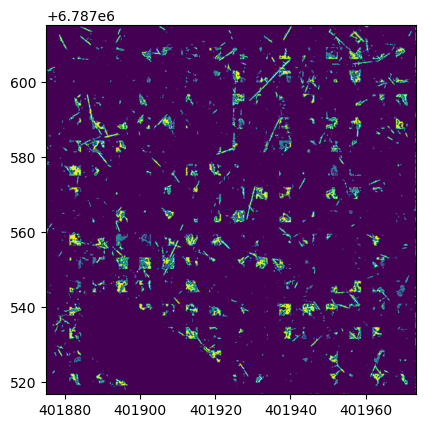

(2031, 2030)


In [84]:
with rio.open('/scratch/deadwood/segmentation/models/proto10new/test/predictions/16_1140.tif') as im:
    rioplot.show(im)#, ax=axs[0])
    print(im.shape)

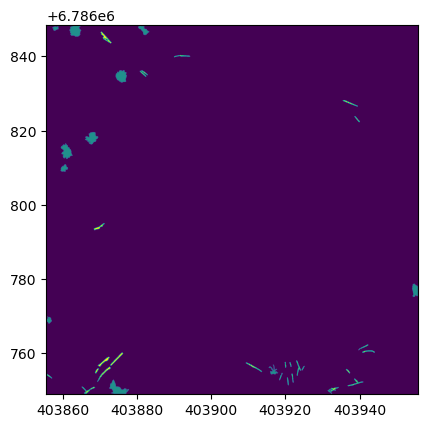

(2052, 2063)


In [58]:
with rio.open('/scratch/deadwood/segmentation/models/proto10new/test/truths/34_1200.tif') as im:
    rioplot.show(im)#, ax=axs[0])
    print(im.shape)

#with rio.open(outpath/d/"raster_tiles"/ex_file) as im:
 #   rioplot.show(im, ax=axs[0])

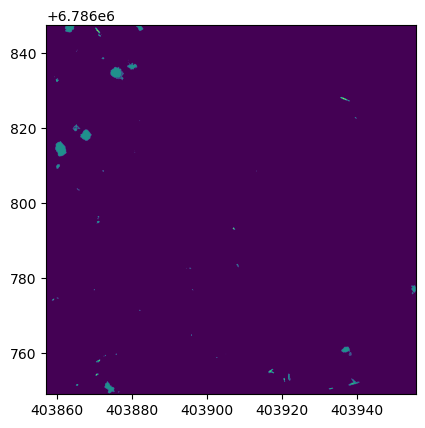

(2031, 2031)


In [59]:
with rio.open('/scratch/deadwood/segmentation/models/proto10new/test/predictions/34_1200.tif') as im:
    rioplot.show(im)#, ax=axs[0])
    print(im.shape)

In [ ]:
#for fname in os.listdir(vector_path):
#    gdf = gpd.read_file(vector_path/fname)
#    gdf['groundwood'] = gdf.apply(lambda row: 2 if row.label == 'groundwood' else 1, axis=1)
#    gdf.to_file(vector_path/fname)

## From [Using fastai for segmentation](https://jaeeolma.github.io/drone_detector/examples.fastai.segmentation.html)

Some helper functions for inference, such as removing all resizing transforms.

In [3]:
def label_func(fn):
    return str(fn).replace('raster_tiles', 'mask_tiles')

@patch 
def remove(self:Pipeline, t):
    for i,o in enumerate(self.fs):
        if isinstance(o, t.__class__): self.fs.pop(i)
            
@patch
def set_base_transforms(self:DataLoader):
    attrs = ['after_item', 'after_batch']
    for i, attr in enumerate(attrs):
        tfms = getattr(self, attr)
        for j, o in enumerate(tfms):
            if hasattr(o, 'size'):
                tfms.remove(o)
            setattr(self, attr, tfms)

Load learners and remove all resizing transforms. If you run out of memory just restart the kernel.

In [ ]:
doc(load_learner)

In [4]:
testlearn = load_learner('/scratch/deadwood/segmentation/models/proto10new/models/unet-segmentation-test-proto10new-LF_FLF-00.pkl', cpu=False)
testlearn.dls.valid.set_base_transforms()

In [5]:
import PIL
def unet_predict(fn):
    image = np.array(PIL.Image.open(fn))
    mask = testlearn.predict(PILImage.create(image))[0].numpy()
    img = image
    img[:,:,0][mask==0] = 0
    img[:,:,1][mask==0] = 0
    img[:,:,2][mask==0] = 0
    img = PIL.Image.fromarray(img.astype(np.uint8))
    return img

In [6]:
test_images = [f'/scratch/deadwood/segmentation/models/proto10new/test/images/{f}' for f in os.listdir('/scratch/deadwood/segmentation/models/proto10new/test/images/')]

### First result

/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:372: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:98: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


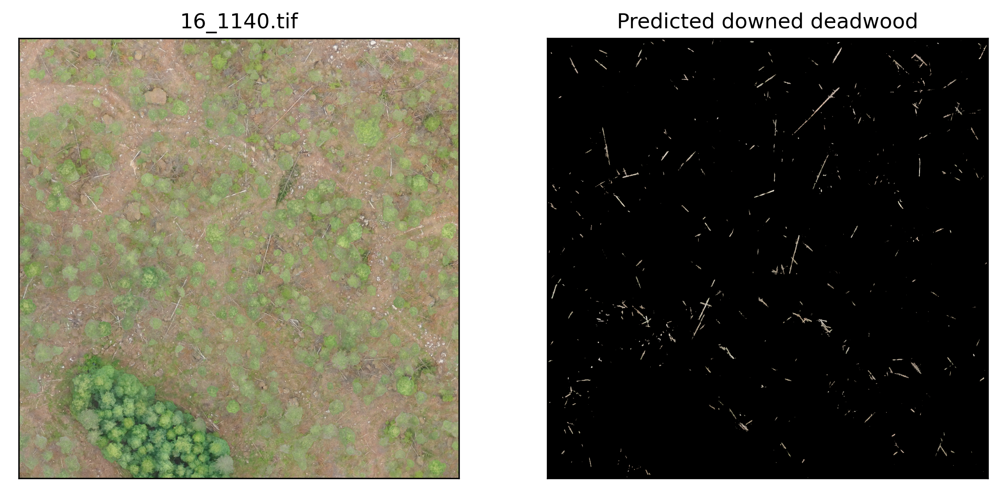

In [7]:
patch_pred = unet_predict(test_images[0])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[0]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[0].split('/')[-1])
axs[1].set_title('Predicted downed deadwood')
plt.show()

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[0]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[0].split('/')[-1])
axs[1].set_title('Predicted deadwood')
plt.show()

### Second result

In [ ]:
patch_pred = unet_predict(test_images[1])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[1]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[1].split('/')[-1])
axs[1].set_title('Predicted deadwood')
plt.show()

## Calculating metrics

***
### From the original notebook:

In [ ]:
patch_pred = unet_predict(test_images[1])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[1]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[1].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Third result

In [ ]:
patch_pred = unet_predict(test_images[2])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[2]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[2].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Fourth example.

In [ ]:
patch_pred = unet_predict(test_images[3])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[3]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[3].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

In [ ]:
# hide

from nbdev.export import notebook2script
notebook2script()
!nbdev_build_docs